Combine multiple shots into 1 image

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import astropy as astro
#from scipy import stats
#from scipy.optimize import curve_fit

from astropy.io import fits
from astropy.wcs import WCS

!pip install --upgrade pip
!pip install photutils

from photutils.detection import DAOStarFinder
from astropy.stats import mad_std

from astropy.stats import sigma_clipped_stats
from astropy.stats import SigmaClip

from astropy import units as u
from photutils.background import Background2D, MedianBackground
from photutils.aperture import aperture_photometry, CircularAnnulus, CircularAperture

import csv

Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063


+39:34:43.3 16:28:24.24


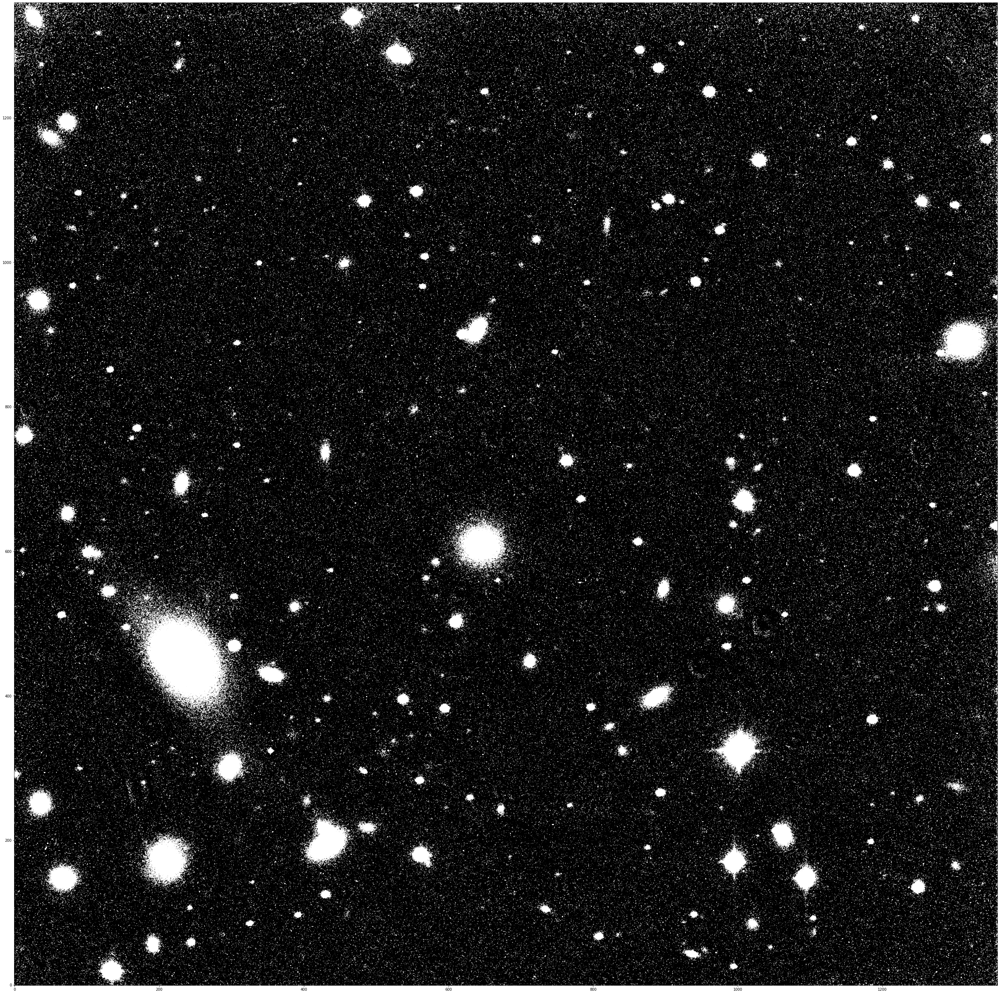

In [14]:
filename = 'a2199.0001.clean.fits'
hdu = fits.open(filename)[0]
image = hdu.data
hdr = hdu.header
print(hdr["DEC"], hdr["RA"])

fig, axs = plt.subplots(1, 1, figsize = (50, 50))
axs.imshow(image, origin='lower', cmap='Greys_r', vmin=10, vmax=50)
plt.show()

In [ ]:
bkg_sigma = mad_std(image)  

daofind = DAOStarFinder(fwhm=4.0, threshold=10.0 * bkg_sigma)  

sources = daofind(image)  

for col in sources.colnames:  
    sources[col].info.format = '%.8g'  # for consistent table output

print(sources)  

In [ ]:
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))  

#radii = [3.0, 4.0, 5.0,7.0,10.0,15.0, 20.0, 25.0, 30.0, 31.0, 32.0]
radii = [3.0, 4.0, 5.0,7.0,10.0,15.0, 20.0, 22.0, 23.0]

apertures = [CircularAperture(positions, r=r) for r in radii]

phot_table = aperture_photometry(image, apertures)

header = []
for col in phot_table.colnames:

    phot_table[col].info.format = '%.8g'  # for consistent table output
    header = np.append(header,col)

print(phot_table)

# save the output for next notebook
f = open('a2199.0001.photometry.csv', 'w')

writer = csv.writer(f)
writer.writerow(header)

for i in range(0,len(phot_table)):
    writer.writerow(phot_table[i])

f.close()

In [ ]:
plt.imshow(image,interpolation='nearest',vmin=5, vmax=50)
aperture = CircularAperture(positions, r=23)
ann_patches = aperture.plot(color='white',lw=1)

7.0 0.9273959410664808 1.0782880921928841


Text(0, 0.5, 'Flux Fraction')

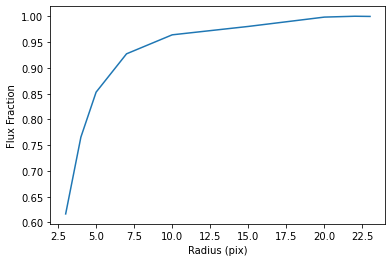

In [4]:
# curve of growth

import pandas as pd
last = len(phot_table.columns)

column = []

for j in range(0,len(phot_table)):
    column.append([])
    for i in range(3,last):
        column[-1].append(phot_table[j][i]/phot_table[j][last-1])

df = pd.DataFrame(column)        
df = df[(df[0]>0.3) & (df[0]<1) & (df[1]>0.3) & (df[1] < 1)]

ap_frac = []
for i in range(3,last):
    ap_frac = np.append(ap_frac,df[i-3].mean())

print(radii[3], ap_frac[3], 1/ap_frac[3])
plt.plot(radii,ap_frac)  
plt.xlabel('Radius (pix)')
plt.ylabel('Flux Fraction')

In [2]:
!pip install --upgrade pip
!pip install astrometry

import matplotlib.pyplot as plt
import csv
import astrometry
import pandas as pd
import astropy.units as u
import numpy as np

import astropy as ap
from astropy.wcs import WCS
from astropy.io import fits

# the 'scales' in the following need to be chosen match to the estimated field-of-view (see https://pypi.org/project/astrometry/)
# these scales are the ones for the image you are working with

solver = astrometry.Solver(
    astrometry.series_5200.index_files(
        cache_directory="astrometry_cache",
        scales={1,3},
    )
)

Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [ ]:
# read the CSV file and make a list of coordinate pairs for astronometry solver
import re
catalog = pd.read_csv('a2199.0001.photometry.csv')

unit = "pix"
x = [sub.replace(unit, "").strip() for sub in catalog['xcenter']]
y = [sub.replace(unit, "").strip() for sub in catalog['ycenter']]

stars = [(x[i],y[i]) for i in range(0,len(x))]

In [ ]:
filename = 'a2199.0001.clean.fits'
hdu = fits.open(filename)[0]
image = hdu.data
hdr = hdu.header

import astrometry
import logging

logging.getLogger().setLevel(logging.INFO)

# start with values close to the what is given in the header
solution = solver.solve(
    stars=stars,
    size_hint=None,
    position_hint=astrometry.PositionHint(
        ra_deg=247.1,
        dec_deg=39.6,
        radius_deg=1.0),
    solution_parameters=astrometry.SolutionParameters(),
)    

# defines new wcs reference frame using solved for values

if solution.has_match():
    wcs = solution.best_match().astropy_wcs()
    
# it there is a good solution check out correspondence with previous values
    print('The header RA is ',hdr['RA'],'and the solved RA is ',solution.best_match().center_ra_deg)
    print('The header Dec is ',hdr['DEC'],'and the solved Dec is ',solution.best_match().center_dec_deg)
    print('The header plate scale is ',hdr['PIXSCAL1'],'and the solved plate scale is ',solution.best_match().scale_arcsec_per_pixel)

In [ ]:
# define the image, open, and read the header information - use your reduced image from the previous workbook

# Create the plotting object with the WCS projection.
plt.figure(figsize = (20,20))
plt.subplot(projection=wcs)
plt.imshow(image, vmin=10, vmax=50)
plt.grid(color='white', ls='solid', alpha=1)
plt.xlabel('Right Ascension',fontsize=24)
plt.ylabel('Declination',fontsize=24)

In [ ]:
# print out the coordinates of the stars that were used for the coordinate solution

if solution.has_match():
    i = 1
    for star in solution.best_match().stars:
        print(f"{i}: {star.ra_deg:.5f} {star.dec_deg:.5f}")
        i += 1

In [ ]:
wcs = solution.best_match().astropy_wcs()
pixels = wcs.all_world2pix(
    [[star.ra_deg, star.dec_deg] for star in solution.best_match().stars],
    0)

In [ ]:
print(pixels)

In [16]:
# The same thing for all images

relation_pixels = []

for j in range(1, 7):
    filename = f'a2199.000{j}.r.clean.fits'
    hdu = fits.open(filename)[0]
    image = hdu.data
    hdr = hdu.header
    
    bkg_sigma = mad_std(image)  
    daofind = DAOStarFinder(fwhm=4.0, threshold=10.0 * bkg_sigma)  
    sources = daofind(image)  
    for col in sources.colnames:  
        sources[col].info.format = '%.8g'  # for consistent table output
        
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))  

    #radii = [3.0, 4.0, 5.0,7.0,10.0,15.0, 20.0, 25.0, 30.0, 31.0, 32.0]
    radii = [3.0, 4.0, 5.0,7.0,10.0,15.0, 20.0, 22.0, 23.0]

    apertures = [CircularAperture(positions, r=r) for r in radii]

    phot_table = aperture_photometry(image, apertures)

    header = []
    for col in phot_table.colnames:

        phot_table[col].info.format = '%.8g'  # for consistent table output
        header = np.append(header,col)
    
    # save the output for next notebook
    f = open(f'a2199.000{j}.r.photometry.csv', 'w')

    writer = csv.writer(f)
    writer.writerow(header)

    for i in range(0,len(phot_table)):
        writer.writerow(phot_table[i])

    f.close()

    catalog = pd.read_csv(f'a2199.000{j}.r.photometry.csv')

    unit = "pix"
    x = [sub.replace(unit, "").strip() for sub in catalog['xcenter']]
    y = [sub.replace(unit, "").strip() for sub in catalog['ycenter']]

    stars = [(x[i],y[i]) for i in range(0,len(x))]
    
    logging.getLogger().setLevel(logging.INFO)

    # start with values close to the what is given in the header
    solution = solver.solve(
        stars=stars,
        size_hint=None,
        position_hint=astrometry.PositionHint(
            ra_deg=247.1,
            dec_deg=39.6,
            radius_deg=1.0),
        solution_parameters=astrometry.SolutionParameters(),
    )    

    # defines new wcs reference frame using solved for values

    if solution.has_match():
        wcs = solution.best_match().astropy_wcs()

    # it there is a good solution check out correspondence with previous values
        print('The header RA is ',hdr['RA'],'and the solved RA is ',solution.best_match().center_ra_deg)
        print('The header Dec is ',hdr['DEC'],'and the solved Dec is ',solution.best_match().center_dec_deg)
        print('The header plate scale is ',hdr['PIXSCAL1'],'and the solved plate scale is ',solution.best_match().scale_arcsec_per_pixel)
    
    wcs = solution.best_match().astropy_wcs()
    pixels = wcs.all_world2pix(
    [[star.ra_deg, star.dec_deg] for star in solution.best_match().stars],
    0)
    
    coord_to_pixel = {}
    i = 0
    for star in solution.best_match().stars:
        coord_to_pixel[(star.ra_deg, star.dec_deg)] = (pixels[i][0], pixels[i][1])
        i += 1
    relation_pixels.append(coord_to_pixel)

INFO:root:solve 13: logodds=145.672, matches=25, conflicts=2, distractors=111, ra=247.092, dec=39.577, scale=0.42677, index="5200/index-5203-10.fits"
INFO:root:solve 13: logodds=145.145, matches=25, conflicts=2, distractors=112, ra=247.092, dec=39.577, scale=0.426769, index="5200/index-5203-10.fits"
INFO:root:solve 13: logodds=143.477, matches=25, conflicts=2, distractors=98, ra=247.092, dec=39.5771, scale=0.425984, index="5200/index-5203-10.fits"
INFO:root:solve 13: logodds=144.727, matches=25, conflicts=2, distractors=111, ra=247.092, dec=39.577, scale=0.426659, index="5200/index-5203-10.fits"
INFO:root:solve 13: logodds=139.206, matches=25, conflicts=2, distractors=111, ra=247.092, dec=39.577, scale=0.425777, index="5200/index-5203-10.fits"
INFO:root:solve 13: logodds=138.647, matches=25, conflicts=2, distractors=112, ra=247.092, dec=39.5771, scale=0.425775, index="5200/index-5203-10.fits"
INFO:root:solve 13: logodds=138.639, matches=25, conflicts=2, distractors=112, ra=247.092, dec

The header RA is  16:28:25.23 and the solved RA is  247.0925012151977
The header Dec is  +39:34:38.3 and the solved Dec is  39.57701431751869
The header plate scale is  0.15 and the solved plate scale is  0.4265020590030004


In [18]:
# Find shifts from image 1
shift_xs, shift_ys = [], []
for i in range(6):
    shift_x, shift_y = 0.0, 0.0
    N = 0
    for key in relation_pixels[0].keys():
        if key in relation_pixels[i]:
            N += 1
            shift_x += relation_pixels[i][key][0]-relation_pixels[0][key][0]
            shift_y += relation_pixels[i][key][1]-relation_pixels[0][key][1]
    shift_x, shift_y = int(shift_x/N), int(shift_y/N)
    print(shift_x, shift_y)
    shift_xs.append(shift_x)
    shift_ys.append(shift_y)

0 0
-11 0
-23 0
-18 11
-6 10
5 11


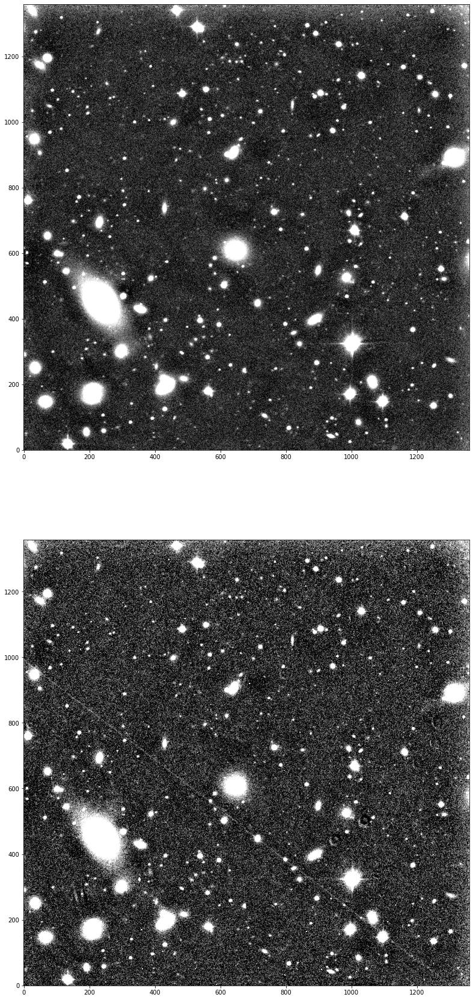

In [19]:
# Combine the images
load_images = []
for i in range(1, 7):
    filename = f"a2199.000{i}.r.clean.fits"
    hdu = fits.open(filename)[0]
    image = hdu.data
    hdr = hdu.header
    load_images.append(image)

combined_image = load_images[0].copy()
for pix_x in range(len(load_images[0])):
    for pix_y in range(len(load_images[0][0])):
        stack = [combined_image[pix_x][pix_y]]
        for i in range(1, 6):
            shift_x, shift_y = shift_ys[i], shift_xs[i]
            abs_x, abs_y = pix_x+shift_x, pix_y+shift_y
            if (abs_x >= 0) and (abs_y >= 0) and (abs_x < len(load_images[i])) and (abs_y < len(load_images[i][0])):
                stack.append(load_images[i][abs_x][abs_y])
            else:
                pass
                #stack.append(load_images[0][pix_x][pix_y])
        combined_image[pix_x][pix_y] = np.median(stack)
fig, axs = plt.subplots(2, 1, figsize=(30, 30))
axs[0].imshow(combined_image, origin='lower', cmap='Greys_r', vmin=np.median(combined_image)-10, vmax=np.median(combined_image)+50)
axs[1].imshow(load_images[0], origin='lower', cmap='Greys_r', vmin=np.median(combined_image)-10, vmax=np.median(combined_image)+50)


In [20]:
fits.writeto(f"a2199.r.combined.fits", combined_image, overwrite=True)

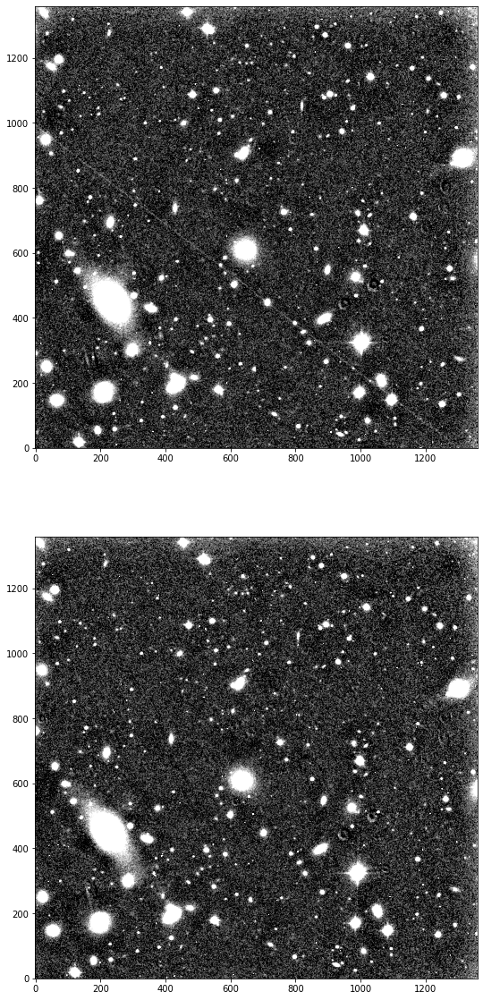

In [21]:
fig, axs = plt.subplots(2, 1, figsize=(20, 20))
axs[0].imshow(load_images[0], origin='lower', cmap='Greys_r', vmin=np.median(combined_image)-10, vmax=np.median(combined_image)+50)
axs[1].imshow(load_images[1], origin='lower', cmap='Greys_r', vmin=np.median(combined_image)-10, vmax=np.median(combined_image)+50)

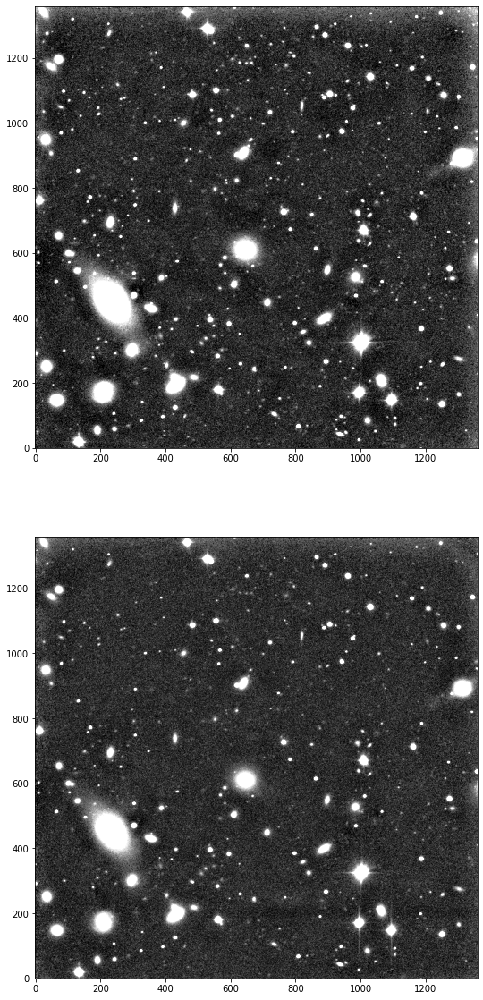

In [27]:
filename = f'a2199.r.combined.fits'
hdu = fits.open(filename)[0]
image1 = hdu.data
hdr = hdu.header

filename = f'a2199.v.combined.fits'
hdu = fits.open(filename)[0]
image2 = hdu.data
hdr = hdu.header

fig, axs = plt.subplots(2, 1, figsize=(20, 20))
axs[0].imshow(image1, origin='lower', cmap='Greys_r', vmin=np.median(image1)-10, vmax=np.median(image1)+50)
axs[1].imshow(image2, origin='lower', cmap='Greys_r', vmin=np.median(image2)-10, vmax=np.median(image2)+50)